In [1]:
1+1

2

# We are exploring the S&P 500 market index using basic time series analysis techniques just for fun.

We will test the exponential fit by fitting a regression line to the log transform and predict the upcoming cusp as of Mar 30 2024


In [2]:
# %pip install yfinance pandas seaborn matplotlib numpy statsmodels scipy scikit-learn dtale ipykernel ipywidgets bokeh jupyter_bokeh

In [3]:
# Importing the libraries, setting up the environment and downloading the data

import yfinance as yf
from datetime import date
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
import dtale
from bokeh.plotting import figure, show, output_file, save
from bokeh.models import ColumnDataSource, NumeralTickFormatter, HoverTool, CrosshairTool
from bokeh.io import output_notebook



# Setting up boken for jupyter notebook otuput instead of browser
# output_notebook()

today = date.today()

# Downloading S&P 500 data from Yahoo Finance
df = yf.download('^GSPC', '1931-01-01', today)

df['Day']= df.index

# convert the datetime index to ordinal values, which can be used to plot a regression line
df.index = df.index.map(pd.Timestamp.toordinal)

# Logarithmic transformation (assuming positive 'Close' values)
df['Log_Close'] = np.log(df['Close'])  

display(df.iloc[:, :])


[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close
Date,,,,,,,,
704919,15.850000,15.850000,15.850000,15.850000,15.850000,0,1931-01-02,2.763170
704922,15.930000,15.930000,15.930000,15.930000,15.930000,0,1931-01-05,2.768204
704923,16.129999,16.129999,16.129999,16.129999,16.129999,0,1931-01-06,2.780681
704924,15.090000,15.090000,15.090000,15.090000,15.090000,0,1931-01-07,2.714032
704925,16.230000,16.230000,16.230000,16.230000,16.230000,0,1931-01-08,2.786861
...,...,...,...,...,...,...,...,...
738972,5226.310059,5249.259766,5213.919922,5248.490234,5248.490234,3850500000,2024-03-27,8.565696
738973,5248.029785,5264.850098,5245.819824,5254.350098,5254.350098,3998270000,2024-03-28,8.566812
738977,5257.970215,5263.950195,5229.200195,5243.770020,5243.770020,3325930000,2024-04-01,8.564796


Fitting the regression line

In [4]:
# convert the regression line start date to ordinal
x1 = pd.to_datetime('1932-01-01').toordinal()

# data slice for the regression line
data=df.loc[x1:].reset_index()

# create a linear regression model
model = LinearRegression()

# fit the model
model.fit(data[['Date']], data['Log_Close'])

slope = model.coef_[0]
intercept = model.intercept_
R2 = model.score(data[['Date']], data['Log_Close'])

equation = f'Lin_Regr_Log_Close = {slope:.4f} * Date {'+' if intercept >=0 else ''}{intercept:.4f}'


# make predictions
data['Linear'] = model.predict(data[['Date']])
data['Prediction_of_Close'] = np.exp(data['Linear'])



#print the model details including the slope, intercept, r-squared, and p-value, etc.
print('Slope:', slope)
print('Intercept:', intercept)
print('R-squared:', R2)

equation = f'Lin_Regr_Log_Close = {slope:.4f}*Date{'+' if intercept >=0 else ''}{intercept:.4f}'
print('The equation of the regression line is:', equation)

Slope: 0.0001901866209663875
Intercept: -132.28691921519902
R-squared: 0.9778073817920057
The equation of the regression line is: Lin_Regr_Log_Close = 0.0002*Date-132.2869


In [5]:
#Display the data
display(data.iloc[:, :])

,Date,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close,Linear,Prediction_of_Close
0,705286,7.560000,7.560000,7.560000,7.560000,7.560000,0,1932-01-04,2.022871,1.849042,6.353729
1,705287,7.550000,7.550000,7.550000,7.550000,7.550000,0,1932-01-05,2.021548,1.849232,6.354938
2,705288,8.080000,8.080000,8.080000,8.080000,8.080000,0,1932-01-06,2.089392,1.849422,6.356147
3,705289,8.220000,8.220000,8.220000,8.220000,8.220000,0,1932-01-07,2.106570,1.849612,6.357356
4,705290,8.570000,8.570000,8.570000,8.570000,8.570000,0,1932-01-08,2.148268,1.849803,6.358565
...,...,...,...,...,...,...,...,...,...,...,...
23171,738972,5226.310059,5249.259766,5213.919922,5248.490234,5248.490234,3850500000,2024-03-27,8.565696,8.255668,3849.384150
23172,738973,5248.029785,5264.850098,5245.819824,5254.350098,5254.350098,3998270000,2024-03-28,8.566812,8.255859,3850.116321
23173,738977,5257.970215,5263.950195,5229.200195,5243.770020,5243.770020,3325930000,2024-04-01,8.564796,8.256619,3853.046398
23174,738978,5204.290039,5208.339844,5184.049805,5205.810059,5205.810059,3886590000,2024-04-02,8.557531,8.256810,3853.779266


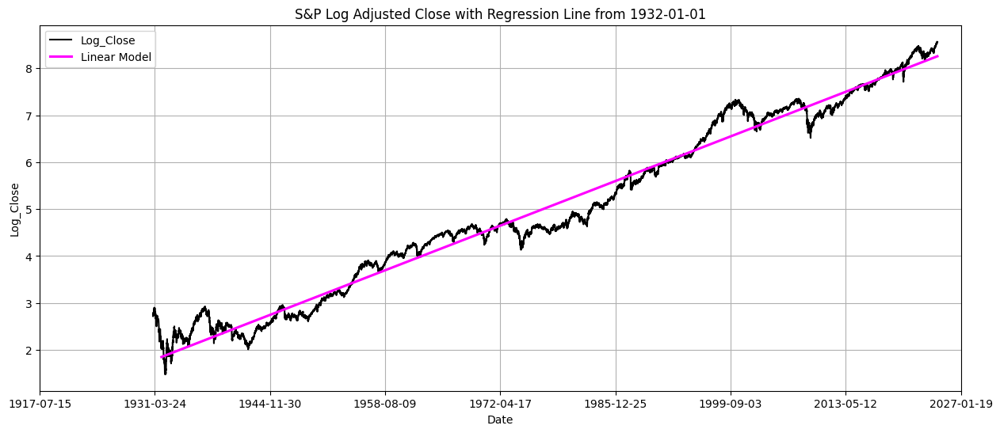

In [6]:

# convert the regression line start date to ordinal
x1 = pd.to_datetime('1932-01-01').toordinal()

# data slice for the regression line
data_sn=df.loc[x1:].reset_index()

# plot the log Close data
ax1 = df.plot(y='Log_Close', c='k', figsize=(15, 6), grid=True, legend=False,
              title='S&P Log Adjusted Close with Regression Line from 1932-01-01')

# add a regression line
sns.regplot(data=data_sn, x='Date', y='Log_Close', ax=ax1, color='magenta', scatter_kws={'s': 7}, label='Linear Model', scatter=False)

ax1.set_xlim(df.index[0], df.index[-1])

# convert the axis back to datetime
xticks = ax1.get_xticks()
labels = [pd.Timestamp.fromordinal(int(label)).date() for label in xticks]
ax1.set_xticks(xticks)
ax1.set_xticklabels(labels)

ax1.legend()

plt.show()

Plot in seaborn

## Making a dynamic version of the plot using Bokeh

In [7]:
display(data.iloc[:, :])

,Date,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close,Linear,Prediction_of_Close
0,705286,7.560000,7.560000,7.560000,7.560000,7.560000,0,1932-01-04,2.022871,1.849042,6.353729
1,705287,7.550000,7.550000,7.550000,7.550000,7.550000,0,1932-01-05,2.021548,1.849232,6.354938
2,705288,8.080000,8.080000,8.080000,8.080000,8.080000,0,1932-01-06,2.089392,1.849422,6.356147
3,705289,8.220000,8.220000,8.220000,8.220000,8.220000,0,1932-01-07,2.106570,1.849612,6.357356
4,705290,8.570000,8.570000,8.570000,8.570000,8.570000,0,1932-01-08,2.148268,1.849803,6.358565
...,...,...,...,...,...,...,...,...,...,...,...
23171,738972,5226.310059,5249.259766,5213.919922,5248.490234,5248.490234,3850500000,2024-03-27,8.565696,8.255668,3849.384150
23172,738973,5248.029785,5264.850098,5245.819824,5254.350098,5254.350098,3998270000,2024-03-28,8.566812,8.255859,3850.116321
23173,738977,5257.970215,5263.950195,5229.200195,5243.770020,5243.770020,3325930000,2024-04-01,8.564796,8.256619,3853.046398
23174,738978,5204.290039,5208.339844,5184.049805,5205.810059,5205.810059,3886590000,2024-04-02,8.557531,8.256810,3853.779266


In [8]:
# adding column selection to the plot_regression_line function
def plot_regression_line(data, equation, title='S&P 500 Index (1931-2024)', cols=['Day', 'Log_Close', 'Linear'], if_notebook=True, if_save=False, filename='Regression_Line.html'):
    # Create a new figure
    p = figure(title=title, x_axis_label='Year', y_axis_label='Log S&P 500 Index', width=1000, height=600, x_axis_type='datetime')

    # Define the source variable
    source = ColumnDataSource(data=data)

    # Define the colors for the lines
    colors = ['blue', 'red', 'green', 'orange', 'purple']  # Add more colors if needed

    # Plot the lines
    for i in range(1, len(cols)):
        p.line(x=cols[0], y=cols[i], source=source, line_width=2, legend_label=cols[i], color=colors[i-1])  # Use different color for each line

    # Add hover functionality from the list of columns
    tooltips = [(cols[0], '@' + cols[0] + '{%F}')]
    for i in range(1, len(cols)):
        tooltips.extend([(cols[i], '@' + cols[i] + '{0,0.00}')])
    hover_tool = HoverTool(tooltips=tooltips, formatters={'@' + cols[0]: 'datetime'})

    # hover_tool = HoverTool(tooltips=[('Year', '@' + cols[0] + '{%F}'), (cols[1], '@' + cols[1] + '{0,0.00}'), (cols[2], '@' + cols[2] + '{0,0.00}')], formatters={'@' + cols[0]: 'datetime'})
    p.add_tools(hover_tool)

    # Add the equation of the regression line
    # p.text(x=400 , y=0.5, text=[equation], text_font_size='18pt', text_align='center')

    # Format the y-axis tick labels
    p.yaxis.formatter = NumeralTickFormatter(format='0,0.00')

    # Relocate the legend to top left
    p.legend.location = 'top_left'

    

    # Show the plot
    if if_notebook:
        output_notebook()
        show(p)
    else:
        show(p)

    # Save the plot
    if if_save:
        output_file(filename, title=title)
        save(p)
        print(f'The plot is saved as {filename}.')
    else:
        print('The plot is displayed in the notebook.')

    return p


plot_regression_line(data, equation, title='S&P 500 Index (1931-2024)', cols=['Day', 'Log_Close', 'Linear'], if_notebook=True, if_save=False, filename='Regression_Line.html')



Loading BokehJS ...

The plot is displayed in the notebook.


figure(id='p1001', ...)

We extend daily till year_future year and predict 

In [9]:
data['Day'].max()
plot_regression_line(data.loc[data['Day'] >= pd.to_datetime('1950-01-01')], equation, title='S&P 500 Index (1931-2024)', cols=['Day', 'Log_Close', 'Linear'])

Loading BokehJS ...

The plot is displayed in the notebook.


figure(id='p1085', ...)

In [10]:
#We extend daily intil the year year_future forward  
# create a new dataframe for the future dates
year_future = 2030

today = date.today()

# convert the 'Day' column to datetime
data['Day'] = pd.to_datetime(data['Day'])

delta_years = year_future - data['Day'].max().year
future_dates = pd.date_range(start=data['Day'].max(), periods=delta_years*365, freq='D')


print(future_dates)

# convert the future dates to ordinal
future_dates_od = future_dates.map(pd.Timestamp.toordinal)
print(future_dates_od)

# convert future_dates to a numpy array
future_dates_od_np = np.array(future_dates_od)
print(future_dates_od_np)


#create a new dataframe for the future dates and add above 3 columns
future_data = pd.DataFrame(future_dates, columns=['Day'])
future_data['Day_od'] = future_dates_od

#predict the S&P 500 index using the linear regression model and add to the dataframe
future_data['Linear'] = model.predict(future_dates_od_np.reshape(-1, 1))
future_data['Prediction_of_Close'] = np.exp(future_data['Linear'])

display(future_data.iloc[:, :])

DatetimeIndex(['2024-04-03', '2024-04-04', '2024-04-05', '2024-04-06',
               '2024-04-07', '2024-04-08', '2024-04-09', '2024-04-10',
               '2024-04-11', '2024-04-12',
               ...
               '2030-03-23', '2030-03-24', '2030-03-25', '2030-03-26',
               '2030-03-27', '2030-03-28', '2030-03-29', '2030-03-30',
               '2030-03-31', '2030-04-01'],
              dtype='datetime64[ns]', length=2190, freq='D')
Index([738979, 738980, 738981, 738982, 738983, 738984, 738985, 738986, 738987,
       738988,
       ...
       741159, 741160, 741161, 741162, 741163, 741164, 741165, 741166, 741167,
       741168],
      dtype='int64', length=2190)
[738979 738980 738981 ... 741166 741167 741168]


/home/norayr/.pyenv/versions/3.12.0/envs/market/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



,Day,Day_od,Linear,Prediction_of_Close
0,2024-04-03,738979,8.257000,3854.512273
1,2024-04-04,738980,8.257190,3855.245419
2,2024-04-05,738981,8.257380,3855.978705
3,2024-04-06,738982,8.257570,3856.712130
4,2024-04-07,738983,8.257761,3857.445695
...,...,...,...,...
2185,2030-03-28,741164,8.672558,5840.417288
2186,2030-03-29,741165,8.672748,5841.528163
2187,2030-03-30,741166,8.672938,5842.639249
2188,2030-03-31,741167,8.673128,5843.750547


In [11]:
# Concatenate the original data frame and the future data frame
extended_df = pd.concat([df, future_data[['Day', 'Prediction_of_Close']]])

# add day ordinal to the extended dataframe
extended_df['Day_od'] = extended_df['Day'].apply(pd.to_datetime).apply(pd.Timestamp.toordinal)

# add the regression line to the extended dataframe
extended_df['Linear'] = model.predict(np.array(extended_df[['Day_od']]).reshape(-1, 1))

# add the prediction of the close to the extended dataframe
extended_df['Prediction_of_Close'] = np.exp(extended_df['Linear'])

# Display the extended data frame
display(extended_df.iloc[:, :])

/home/norayr/.pyenv/versions/3.12.0/envs/market/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear
704919,15.850000,15.850000,15.850000,15.850000,15.850000,0.0,1931-01-02,2.763170,5.925372,704919,1.779243
704922,15.930000,15.930000,15.930000,15.930000,15.930000,0.0,1931-01-05,2.768204,5.928754,704922,1.779814
704923,16.129999,16.129999,16.129999,16.129999,16.129999,0.0,1931-01-06,2.780681,5.929881,704923,1.780004
704924,15.090000,15.090000,15.090000,15.090000,15.090000,0.0,1931-01-07,2.714032,5.931009,704924,1.780194
704925,16.230000,16.230000,16.230000,16.230000,16.230000,0.0,1931-01-08,2.786861,5.932137,704925,1.780385
...,...,...,...,...,...,...,...,...,...,...,...
2185,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-28,NaN,5840.417288,741164,8.672558
2186,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-29,NaN,5841.528163,741165,8.672748
2187,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-30,NaN,5842.639249,741166,8.672938
2188,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-31,NaN,5843.750547,741167,8.673128


In [12]:
#display the data from 1950 to 2026
data_1950_2026 = extended_df.loc[extended_df['Day'] >= pd.to_datetime('1950-01-01')]
display(data_1950_2026.iloc[:, :])
plot_regression_line(data_1950_2026, equation, title='S&P 500 Index (1931-2024)', cols=['Day', 'Log_Close', 'Linear'])

,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear
711860,16.66,16.66,16.66,16.66,16.66,1260000.0,1950-01-03,2.813011,22.183057,711860,3.099329
711861,16.85,16.85,16.85,16.85,16.85,1890000.0,1950-01-04,2.824351,22.187276,711861,3.099519
711862,16.93,16.93,16.93,16.93,16.93,2550000.0,1950-01-05,2.829087,22.191496,711862,3.099709
711863,16.98,16.98,16.98,16.98,16.98,2010000.0,1950-01-06,2.832036,22.195717,711863,3.099899
711866,17.08,17.08,17.08,17.08,17.08,2520000.0,1950-01-09,2.837908,22.208385,711866,3.100470
...,...,...,...,...,...,...,...,...,...,...,...
2185,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-28,NaN,5840.417288,741164,8.672558
2186,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-29,NaN,5841.528163,741165,8.672748
2187,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-30,NaN,5842.639249,741166,8.672938
2188,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-31,NaN,5843.750547,741167,8.673128


Loading BokehJS ...

The plot is displayed in the notebook.


figure(id='p1169', ...)

In [13]:
# plotting the extended data frame using the plot_regression_line function
plot_regression_line(extended_df, equation, title=f'S&P 500 Index (1931-{year_future})', cols = ['Day', 'Close', 'Prediction_of_Close'], if_save=True, filename='Prediction_2030_S&P_500_Index.html')


Loading BokehJS ...

The plot is saved as Prediction_2030_S&P_500_Index.html.


figure(id='p1254', ...)

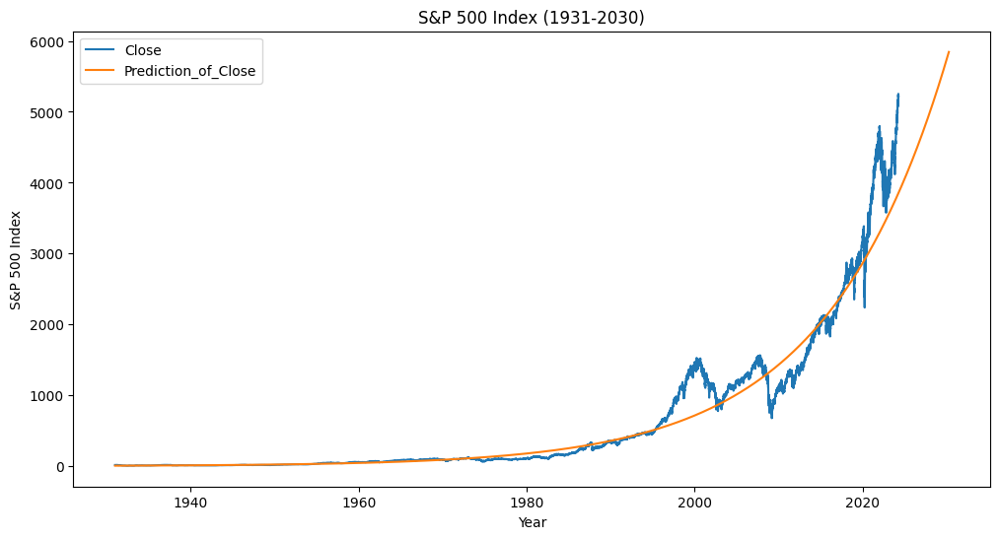

In [14]:
# plot the original data and the extended data
plt.figure(figsize=(12, 6))
sns.lineplot(x='Day', y='Close', data=extended_df, label='Close')
sns.lineplot(x='Day', y='Prediction_of_Close', data=extended_df, label='Prediction_of_Close')
plt.title(f'S&P 500 Index (1931-{year_future})')
plt.xlabel('Year')
plt.ylabel('S&P 500 Index')
plt.legend()
plt.show()


In [15]:
# D-Tale
d = dtale.show(df, host='localhost')   

## The Slope from 2009 looks different, let's fit a linear regression model to the data from 2009 to 2024

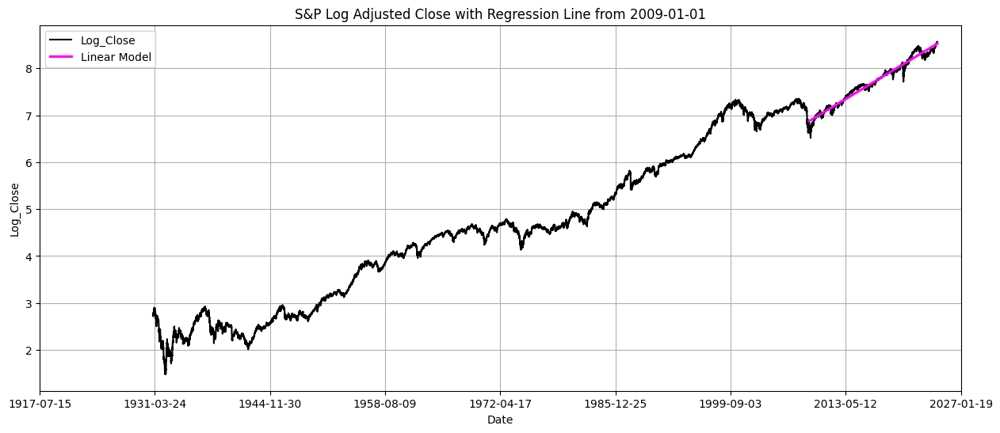

In [16]:


# convert the regression line start date to ordinal
x1 = pd.to_datetime('2009-01-01').toordinal()

# data slice for the regression line
data=df.loc[x1:].reset_index()

# plot the log Close data
ax1 = df.plot(y='Log_Close', c='k', figsize=(15, 6), grid=True, legend=False,
              title='S&P Log Adjusted Close with Regression Line from 2009-01-01')

# add a regression line
sns.regplot(data=data, x='Date', y='Log_Close', ax=ax1, color='magenta', scatter_kws={'s': 7}, label='Linear Model', scatter=False)

ax1.set_xlim(df.index[0], df.index[-1])

# convert the axis back to datetime
xticks = ax1.get_xticks()
labels = [pd.Timestamp.fromordinal(int(label)).date() for label in xticks]
ax1.set_xticks(xticks)
ax1.set_xticklabels(labels)

ax1.legend()

plt.show()


In [17]:
extended_df

,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear
704919,15.850000,15.850000,15.850000,15.850000,15.850000,0.0,1931-01-02,2.763170,5.925372,704919,1.779243
704922,15.930000,15.930000,15.930000,15.930000,15.930000,0.0,1931-01-05,2.768204,5.928754,704922,1.779814
704923,16.129999,16.129999,16.129999,16.129999,16.129999,0.0,1931-01-06,2.780681,5.929881,704923,1.780004
704924,15.090000,15.090000,15.090000,15.090000,15.090000,0.0,1931-01-07,2.714032,5.931009,704924,1.780194
704925,16.230000,16.230000,16.230000,16.230000,16.230000,0.0,1931-01-08,2.786861,5.932137,704925,1.780385
...,...,...,...,...,...,...,...,...,...,...,...
2185,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-28,NaN,5840.417288,741164,8.672558
2186,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-29,NaN,5841.528163,741165,8.672748
2187,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-30,NaN,5842.639249,741166,8.672938
2188,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-31,NaN,5843.750547,741167,8.673128


In [18]:
# Chunk the extended data frame starting from 2009-05-01 
df_2009 = extended_df.loc[extended_df['Day'] >= pd.to_datetime('2009-05-01')]

#truncate df_2009 to the last day we have data in the close column  
df_2009 = df_2009.loc[df_2009['Close'].notnull()]


# Build a regression model to the log
model_2009 = LinearRegression()
model_2009.fit(df_2009[['Day_od']], df_2009['Log_Close'])

# Predict the close using the regression model
df_2009['2009_regr'] = np.exp(model_2009.predict(df_2009[['Day_od']]))

# Display the chunked data frame with the 2009_regr column for close
display(df_2009)


,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear,2009_regr
733528,872.739990,880.479980,866.099976,877.520020,877.520020,5.312170e+09,2009-05-01,6.777100,1366.888802,733528,7.220292,1019.557716
733531,879.210022,907.849976,879.210022,907.239990,907.239990,7.038840e+09,2009-05-04,6.810407,1367.668917,733531,7.220863,1020.450838
733532,906.099976,907.700012,897.340027,903.799988,903.799988,6.882860e+09,2009-05-05,6.806608,1367.929054,733532,7.221053,1020.748720
733533,903.950012,920.280029,903.950012,919.530029,919.530029,8.555040e+09,2009-05-06,6.823863,1368.189240,733533,7.221243,1021.046688
733534,919.580017,929.580017,901.359985,907.390015,907.390015,9.120100e+09,2009-05-07,6.810572,1368.449476,733534,7.221434,1021.344743
...,...,...,...,...,...,...,...,...,...,...,...,...
738972,5226.310059,5249.259766,5213.919922,5248.490234,5248.490234,3.850500e+09,2024-03-27,8.565696,3849.384150,738972,8.255668,4994.324490
738973,5248.029785,5264.850098,5245.819824,5254.350098,5254.350098,3.998270e+09,2024-03-28,8.566812,3850.116321,738973,8.255859,4995.782389
738977,5257.970215,5263.950195,5229.200195,5243.770020,5243.770020,3.325930e+09,2024-04-01,8.564796,3853.046398,738977,8.256619,5001.618246
738978,5204.290039,5208.339844,5184.049805,5205.810059,5205.810059,3.886590e+09,2024-04-02,8.557531,3853.779266,738978,8.256810,5003.078275


In [19]:
#lets add 2009_regr to the extended_df
extended_df['2009_regr_prediction'] = np.exp(model_2009.predict(extended_df[['Day_od']]))

extended_df['2009_regr_linear'] = model_2009.predict(extended_df[['Day_od']])
display(extended_df)


,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear,2009_regr_prediction,2009_regr_linear
704919,15.850000,15.850000,15.850000,15.850000,15.850000,0.0,1931-01-02,2.763170,5.925372,704919,1.779243,0.241003,-1.422948
704922,15.930000,15.930000,15.930000,15.930000,15.930000,0.0,1931-01-05,2.768204,5.928754,704922,1.779814,0.241214,-1.422072
704923,16.129999,16.129999,16.129999,16.129999,16.129999,0.0,1931-01-06,2.780681,5.929881,704923,1.780004,0.241284,-1.421780
704924,15.090000,15.090000,15.090000,15.090000,15.090000,0.0,1931-01-07,2.714032,5.931009,704924,1.780194,0.241355,-1.421488
704925,16.230000,16.230000,16.230000,16.230000,16.230000,0.0,1931-01-08,2.786861,5.932137,704925,1.780385,0.241425,-1.421196
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2185,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-28,NaN,5840.417288,741164,8.672558,9469.521449,9.155834
2186,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-29,NaN,5841.528163,741165,8.672748,9472.285709,9.156126
2187,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-30,NaN,5842.639249,741166,8.672938,9475.050776,9.156417
2188,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-31,NaN,5843.750547,741167,8.673128,9477.816651,9.156709


In [20]:
# plot the exetennded data frame with the 2009_regr column using the plot_regression_line function
plot_regression_line(extended_df, equation, title=f'S&P 500 Index (1931-{year_future})', cols=['Day', 'Close', 'Prediction_of_Close', '2009_regr_prediction'],if_notebook=False, if_save=True, filename='Prediction_2030_S&P_500_Index.html')

INFO:bokeh.io.state:Session output file 'Prediction_2030_S&P_500_Index.html' already exists, will be overwritten.


The plot is saved as Prediction_2030_S&P_500_Index.html.


figure(id='p1351', ...)

In [21]:
#calculate percentage of yearly growth of the S&P 500 index per year for 3 different coumns close, prediction_of_close and 2009_regr_prediction
# calculate the percentage of yearly growth
extended_df['Close_pct'] = extended_df['Close'].pct_change() * 100
extended_df['Prediction_of_Close_pct'] = extended_df['Prediction_of_Close'].pct_change() * 100
extended_df['2009_regr_prediction_pct'] = extended_df['2009_regr_prediction'].pct_change() * 100

# Display the extended data frame with the percentage columns
display(extended_df.iloc[:, :])



/tmp/ipykernel_2941587/3565321510.py:3: FutureWarning:

The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear,2009_regr_prediction,2009_regr_linear,Close_pct,Prediction_of_Close_pct,2009_regr_prediction_pct
704919,15.850000,15.850000,15.850000,15.850000,15.850000,0.0,1931-01-02,2.763170,5.925372,704919,1.779243,0.241003,-1.422948,NaN,NaN,NaN
704922,15.930000,15.930000,15.930000,15.930000,15.930000,0.0,1931-01-05,2.768204,5.928754,704922,1.779814,0.241214,-1.422072,0.504731,0.057072,0.087599
704923,16.129999,16.129999,16.129999,16.129999,16.129999,0.0,1931-01-06,2.780681,5.929881,704923,1.780004,0.241284,-1.421780,1.255486,0.019020,0.029191
704924,15.090000,15.090000,15.090000,15.090000,15.090000,0.0,1931-01-07,2.714032,5.931009,704924,1.780194,0.241355,-1.421488,-6.447607,0.019020,0.029191
704925,16.230000,16.230000,16.230000,16.230000,16.230000,0.0,1931-01-08,2.786861,5.932137,704925,1.780385,0.241425,-1.421196,7.554668,0.019020,0.029191
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2185,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-28,NaN,5840.417288,741164,8.672558,9469.521449,9.155834,0.000000,0.019020,0.029191
2186,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-29,NaN,5841.528163,741165,8.672748,9472.285709,9.156126,0.000000,0.019020,0.029191
2187,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-30,NaN,5842.639249,741166,8.672938,9475.050776,9.156417,0.000000,0.019020,0.029191
2188,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-31,NaN,5843.750547,741167,8.673128,9477.816651,9.156709,0.000000,0.019020,0.029191


In [22]:
#show data using dtale
d = dtale.show(extended_df, host='localhost')


In [23]:
# print yearly growth of the S&P 500 index per year in 2023 for 3 different columns close, prediction_of_close and 2009_regr_prediction
year_future = 2024

print(f'Yearly growth of the S&P 500 index per year in {year_future} for 3 different columns:')
print(f'Prediction_of_Close: {100*extended_df.loc[extended_df["Day"] == "2025-01-01", "Prediction_of_Close"].values[0]/extended_df.loc[extended_df["Day"] == "2026-01-01", "Prediction_of_Close"].values[0]:.2f}%')

print(f'Prediction_of_Close: {extended_df.loc[extended_df["Day"] == "2026-01-01", "Prediction_of_Close"].values[0]}')
print(f'Prediction_of_Close: {extended_df.loc[extended_df["Day"] == "2025-01-01", "Prediction_of_Close"].values[0]}')

print(f'2009_regr_prediction: {extended_df.loc[extended_df["Day"] == "2026-01-01", "2009_regr_prediction"].values[0]}')
print(f'2009_regr_prediction: {extended_df.loc[extended_df["Day"] == "2025-01-01", "2009_regr_prediction"].values[0]}')

print(f'Prediction_of_Close: {100*extended_df.loc[extended_df["Day"] == "2025-01-01", "2009_regr_prediction"].values[0]/extended_df.loc[extended_df["Day"] == "2026-01-01", "2009_regr_prediction"].values[0]:.2f}%')

print(extended_df.loc[extended_df["Day"] == "2023-02-01", "Close"])
print(extended_df.loc[extended_df["Day"] == "2024-02-01", "Close"])

print(f'Close: {100*extended_df.loc[extended_df["Day"] == "2023-02-01", "Close"].values[0]/extended_df.loc[extended_df["Day"] == "2024-02-01", "Close"].values[0]:.2f}%')




Yearly growth of the S&P 500 index per year in 2024 for 3 different columns:
Prediction_of_Close: 93.29%
Prediction_of_Close: 4351.77385664079
Prediction_of_Close: 4059.9287673122635
2009_regr_prediction: 6028.857250025037
2009_regr_prediction: 5419.618382073369
Prediction_of_Close: 89.89%
738552    4119.209961
Name: Close, dtype: float64
738917    4906.189941
Name: Close, dtype: float64
Close: 83.96%


In [24]:
# let's make a copy of df
df_2 = df.copy()

#make a np vector of the close column from not extended data frame
close = np.array(df_2['Close'])

close


array([  15.85000038,   15.93000031,   16.12999916, ..., 5243.77001953,
       5205.81005859, 5211.49023438])

In [25]:
# for each day, let's add four columns - 
#first one the min of the close column from that day to the end of the data frame
# max was reached before the day



for i in range(len(close)):
    min_close = min(close[i:])
    max_close = max(close[:i])
    df_2.loc[df_2.index[i], 'close_min_after'] = min_close
    df_2.loc[df_2.index[i], 'close_max_before'] = max_close



# Display the data frame with the new columns
display(df_2.iloc[:, :])

ValueError: max() iterable argument is empty

In [ ]:
# for each day, let's add two more columns - 
# the day to the min was reached
# the day that max was reached before the day
df_2['min_close_day_ord'] = df_2['Close'].apply(lambda x: df_2[df_2['Close'] == x].index[0])
df_2['max_close_day_ord'] = df_2['Close'].apply(lambda x: df_2[df_2['Close'] == x].index[0])


# Display the data frame with the new columns
display(df_2.iloc[:, :])




,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close,min_close,max_close,min_close_day_ord,max_close_day_ord
Date,,,,,,,,,,,,
704919,15.850000,15.850000,15.850000,15.850000,15.850000,0,1931-01-02,2.763170,4.400000,5254.350098,704919,704919
704922,15.930000,15.930000,15.930000,15.930000,15.930000,0,1931-01-05,2.768204,4.400000,5254.350098,704922,704922
704923,16.129999,16.129999,16.129999,16.129999,16.129999,0,1931-01-06,2.780681,4.400000,5254.350098,704923,704923
704924,15.090000,15.090000,15.090000,15.090000,15.090000,0,1931-01-07,2.714032,4.400000,5254.350098,704924,704924
704925,16.230000,16.230000,16.230000,16.230000,16.230000,0,1931-01-08,2.786861,4.400000,5254.350098,704925,704925
...,...,...,...,...,...,...,...,...,...,...,...,...
738972,5226.310059,5249.259766,5213.919922,5248.490234,5248.490234,3850500000,2024-03-27,8.565696,5205.810059,5254.350098,738972,738972
738973,5248.029785,5264.850098,5245.819824,5254.350098,5254.350098,3998270000,2024-03-28,8.566812,5205.810059,5254.350098,738973,738973
738977,5257.970215,5263.950195,5229.200195,5243.770020,5243.770020,3325930000,2024-04-01,8.564796,5205.810059,5243.770020,738977,738977
